In [ ]:
import os

# Define base folder
base_dir = '/content/weed_detection_project'

# Subfolders
folders = [
    'datasets/Weed25/images',
    'datasets/Weed25/annotations',
    'datasets/CropWeed/images',
    'datasets/CropWeed/annotations',
    'models',
    'runs',
    'utils',
    'yolov5'  # YOLOv5 will be cloned here
]

# Create folders
for folder in folders:
    path = os.path.join(base_dir, folder)
    os.makedirs(path, exist_ok=True)

print("✅ Project folder structure created.")

✅ Project folder structure created.


In [ ]:
import xml.etree.ElementTree as ET
import os

classes = ['class1', 'class2', ...]  # Use actual weed names from Weed25

def convert_voc_to_yolo(xml_folder, output_folder, image_folder):
    for file in os.listdir(xml_folder):
        if not file.endswith('.xml'):
            continue
        tree = ET.parse(os.path.join(xml_folder, file))
        root = tree.getroot()

        image_name = root.find('filename').text
        size = root.find('size')
        w = int(size.find('width').text)
        h = int(size.find('height').text)

        txt_file = open(os.path.join(output_folder, file.replace('.xml', '.txt')), 'w')
        for obj in root.iter('object'):
            cls = obj.find('name').text
            if cls not in classes:
                continue
            cls_id = classes.index(cls)
            xmlbox = obj.find('bndbox')
            b = [int(xmlbox.find('xmin').text),
                 int(xmlbox.find('ymin').text),
                 int(xmlbox.find('xmax').text),
                 int(xmlbox.find('ymax').text)]
            # YOLO format
            x_center = (b[0] + b[2]) / 2.0 / w
            y_center = (b[1] + b[3]) / 2.0 / h
            box_width = (b[2] - b[0]) / float(w)
            box_height = (b[3] - b[1]) / float(h)
            txt_file.write(f"{cls_id} {x_center} {y_center} {box_width} {box_height}\n")
        txt_file.close()


In [ ]:
yaml_content = """
train: ../datasets/Weed25/train/images
val: ../datasets/Weed25/val/images

nc: 25
names: ['weed1', 'weed2', 'weed3', 'weed4', 'weed5', 'weed6', 'weed7', 'weed8',
        'weed9', 'weed10', 'weed11', 'weed12', 'weed13', 'weed14', 'weed15', 'weed16',
        'weed17', 'weed18', 'weed19', 'weed20', 'weed21', 'weed22', 'weed23', 'weed24', 'weed25']
"""

with open('/content/weed_detection_project/yolov5/data.yaml', 'w') as f:
    f.write(yaml_content)

print("✅ data.yaml file created.")



✅ data.yaml file created.


In [ ]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt


/content
Cloning into 'yolov5'...
remote: Enumerating objects: 17581, done.
remote: Counting objects: 100% (73/73), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 17581 (delta 42), reused 12 (delta 10), pack-reused 17508 (from 3)
Receiving objects: 100% (17581/17581), 16.64 MiB | 17.57 MiB/s, done.
Resolving deltas: 100% (12036/12036), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 33.4 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')



ValueError: mount failed

In [ ]:
!cp /content/drive/MyDrive/weed_dataset.tar /content/


In [ ]:
!mkdir -p /content/datasets/
!tar -xf /content/weed_dataset.tar -C /content/datasets/


In [ ]:
!ls /content/datasets/ds/ann | head
!ls /content/datasets/ds/img | head


In [ ]:
with open('/content/datasets/ds/ann/12114.jpg.json') as f:
    data = json.load(f)

# See what each object looks like
for obj in data['objects'][:3]:  # Just first 3 objects
    print(obj)


NameError: name 'json' is not defined

In [ ]:
import json
import os

annotation_dir = '/content/datasets/ds/ann'
class_names = set()

for filename in os.listdir(annotation_dir):
    if filename.endswith('.json'):
        with open(os.path.join(annotation_dir, filename)) as f:
            data = json.load(f)
            for obj in data.get("objects", []):
                class_names.add(obj["classTitle"])  # ✅ Correct key

class_names = sorted(list(class_names))
class_to_id = {name: idx for idx, name in enumerate(class_names)}

print("Classes found:", class_to_id)


Classes found: {'crop': 0, 'weed': 1}


In [ ]:
!mkdir -p images/train
!mkdir -p labels/train


In [ ]:
!ls


In [ ]:
!ls images
!ls labels


In [ ]:
!ls images/train | head
!ls labels/train | head


In [ ]:
%cd yolov5


In [ ]:
!pwd


In [ ]:
!ls images/train
!ls labels/train


In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data data.yaml --weights yolov5s.pt --name weed25_baseline


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Traceback (most recent call last):
  File "<frozen importlib._bootstrap>", line 1331, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>", line 935, in _load_unlocked
  File "<frozen importlib._bootstrap_external>", line 999, in exec_module
  File "<frozen importlib._bootstrap>", line 488, in _call_with_frames_removed
  File "/usr/local/lib/python3.12/dist-packages/torch/_dynamo/guards.py", line 61, in <module>
    from torch._dynamo.source import (
  File "/usr/local/lib/python3.12/dist-packages/torch/_dynamo/source.py", line 140, in <module>
    @dataclasses.dataclass(frozen=True)
     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/dataclasses.py", 

In [ ]:
!ls data.yaml


In [ ]:
%%writefile data.yaml
train: ./images/train
val: ./images/val
nc: 2
names: ['weed', 'grass']


Overwriting data.yaml


In [ ]:
%%writefile data.yaml
train: ./images/train
val: ./images/train
nc: 2
names: ['weed', 'grass']


Overwriting data.yaml


In [ ]:
!python train.py --img 640 --batch 16 --epochs 100 --data data.yaml --weights yolov5s.pt --name weed25_baseline





wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-08-28 03:13:33.421107: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756350813.444239   10986 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756350813.455613   10986 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1756350813.480255   10986 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1756350813.480294   10986 computation_placer.cc:177] computation placer already registere

In [ ]:
!ls -la /content/yolov5/images/train



total 377904
drwxr-xr-x 2 root root  36864 Aug 21 09:18 .
drwxr-xr-x 3 root root   4096 Aug 21 09:18 ..
-rw-r--r-- 1 root root 340886 Oct 26  2023 12114.jpg
-rw-r--r-- 1 root root 289137 Oct 26  2023 12120.jpg
-rw-r--r-- 1 root root 291951 Oct 26  2023 12122.jpg
-rw-r--r-- 1 root root 294212 Oct 26  2023 12123.jpg
-rw-r--r-- 1 root root 284472 Oct 26  2023 12147.jpg
-rw-r--r-- 1 root root 297641 Oct 26  2023 12148.jpg
-rw-r--r-- 1 root root 297234 Oct 26  2023 12149.jpg
-rw-r--r-- 1 root root 300141 Oct 26  2023 12150.jpg
-rw-r--r-- 1 root root 313331 Oct 26  2023 12171.jpg
-rw-r--r-- 1 root root 305854 Oct 26  2023 12174.jpg
-rw-r--r-- 1 root root 308726 Oct 26  2023 12197.jpg
-rw-r--r-- 1 root root 283875 Oct 26  2023 12198.jpg
-rw-r--r-- 1 root root 292240 Oct 26  2023 12199.jpg
-rw-r--r-- 1 root root 305568 Oct 26  2023 12200.jpg
-rw-r--r-- 1 root root 314697 Oct 26  2023 12201.jpg
-rw-r--r-- 1 root root 309770 Oct 26  2023 12202.jpg
-rw-r--r-- 1 root root 321932 Oct 26  2023 12203

In [ ]:
!mv /content/datasets/ds/img/* /content/yolov5/images/train/


In [ ]:
!mv /content/datasets/ds/ann/* /content/yolov5/labels/train/


In [ ]:
import os, shutil, random

# Original val path
val_images_path = "/content/yolov5/images/train"
val_labels_path = "/content/yolov5/labels/train"

# New test path
test_images_path = "/content/yolo5/test/images"
test_labels_path = "/content/yolo5/test/labels"

os.makedirs(test_images_path, exist_ok=True)
os.makedirs(test_labels_path, exist_ok=True)

# Split ratio for test (20% of val → test)
split_ratio = 0.2

all_val_imgs = os.listdir(val_images_path)
n_test = int(len(all_val_imgs) * split_ratio)
sample_imgs = random.sample(all_val_imgs, n_test)

for img in sample_imgs:
    label_file = img.replace(".jpg", ".txt").replace(".png", ".txt")

    # Move image
    shutil.move(os.path.join(val_images_path, img), os.path.join(test_images_path, img))

    # Move label if exists
    if os.path.exists(os.path.join(val_labels_path, label_file)):
        shutil.move(os.path.join(val_labels_path, label_file), os.path.join(test_labels_path, label_file))

print(f"✅ Test split created with {len(os.listdir(test_images_path))} images")
print(f"Remaining val images: {len(os.listdir(val_images_path))}")


✅ Test split created with 431 images
Remaining val images: 941


In [ ]:
!ls /content/yolov5/images/train | head
!ls /content/yolov5/labels/train | head


12114.jpg
12120.jpg
12122.jpg
12123.jpg
12147.jpg
12148.jpg
12149.jpg
12150.jpg
12171.jpg
12174.jpg
12114.jpg.json
12114.txt
12120.jpg.json
12120.txt
12122.jpg.json
12122.txt
12123.jpg.json
12123.txt
12147.jpg.json
12147.txt


In [ ]:
!python train.py --img 640 --batch 16 --epochs 10 --data data.yaml --weights yolov5s.pt --name weed25_baseline


^C


In [ ]:
!ls /content/yolov5/labels/train | head


12114.jpg.json
12114.txt
12120.jpg.json
12120.txt
12122.jpg.json
12122.txt
12123.jpg.json
12123.txt
12147.jpg.json
12147.txt


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader

# ✅ Data paths (change this to your Weed25 dataset)
train_dir = "/content/datasets/Weed25/train"
val_dir = "/content/datasets/Weed25/val"

# ✅ Transformations (resize + normalization)
data_transforms = {
    "train": transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    "val": transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# ✅ Load dataset
image_datasets = {
    x: datasets.ImageFolder(root=eval(f"{x}_dir"), transform=data_transforms[x])
    for x in ["train", "val"]
}
dataloaders = {
    x: DataLoader(image_datasets[x], batch_size=32, shuffle=True, num_workers=2)
    for x in ["train", "val"]
}
class_names = image_datasets["train"].classes
print("Classes:", class_names)

# ✅ Use pretrained ResNet18
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(class_names))
model = model.to(device)

# ✅ Loss & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# ✅ Training loop
def train_model(model, criterion, optimizer, num_epochs=5):
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        for phase in ["train", "val"]:
            if phase == "train":
                model.train()
            else:
                model.eval()

            running_loss, running_corrects = 0.0, 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == "train"):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == "train":
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(image_datasets[phase])
            epoch_acc = running_corrects.double() / len(image_datasets[phase])
            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

    return model

# ✅ Train the classifier
model = train_model(model, criterion, optimizer, num_epochs=10)

# ✅ Save model
torch.save(model.state_dict(), "weed_classifier.pth")
print("✅ Model saved as weed_classifier.pth")


FileNotFoundError: [Errno 2] No such file or directory: '/content/datasets/Weed25/train'

In [ ]:
import os
import json

ann_dir = '/content/datasets/ds/ann'
img_dir = '/content/datasets/ds/img'
yolo_labels_dir = '/content/datasets/ds/labels'
os.makedirs(yolo_labels_dir, exist_ok=True)

for filename in os.listdir(ann_dir):
    if filename.endswith('.json'):
        with open(os.path.join(ann_dir, filename)) as f:
            data = json.load(f)
        img_filename = filename.replace('.json', '')
        img_width, img_height = data['size']['width'], data['size']['height']

        yolo_lines = []
        for obj in data.get("objects", []):
            class_id = class_to_id[obj['classTitle']]
            x1, y1 = obj['points']['exterior'][0]
            x2, y2 = obj['points']['exterior'][1]

            # Convert to YOLO format
            x_center = (x1 + x2) / 2.0 / img_width
            y_center = (y1 + y2) / 2.0 / img_height
            width = abs(x2 - x1) / img_width
            height = abs(y2 - y1) / img_height

            yolo_lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

        # Write to YOLO format .txt file
        label_file = os.path.join(yolo_labels_dir, filename.replace('.json', '.txt'))
        with open(label_file, 'w') as f:
            f.write('\n'.join(yolo_lines))


In [ ]:
!find /content -name "*.json"


In [ ]:
import json

# Path to one of your annotation JSON files
json_path = 'import json'

# Path to one of your annotation JSON files
json_path = '/content/yolov5/labels/train/34135.jpg.json'

# Load and display contents
with open(json_path, 'r') as f:
    data = json.load(f)

# Show the contents
import pprint
pprint.pprint(data)


# Load and display contents
with open(json_path, 'r') as f:
    data = json.load(f)

# Show the contents
import pprint
pprint.pprint(data)


{'description': '',
 'objects': [{'classId': 6488780,
              'classTitle': 'weed',
              'createdAt': '2023-10-25T15:23:58.303Z',
              'description': '',
              'geometryType': 'rectangle',
              'id': 77074031,
              'labelerLogin': 'inbox@datasetninja.com',
              'points': {'exterior': [[437, 425], [480, 463]], 'interior': []},
              'tags': [],
              'updatedAt': '2023-10-25T15:23:58.303Z'},
             {'classId': 6488780,
              'classTitle': 'weed',
              'createdAt': '2023-10-25T15:23:58.302Z',
              'description': '',
              'geometryType': 'rectangle',
              'id': 77074030,
              'labelerLogin': 'inbox@datasetninja.com',
              'points': {'exterior': [[240, 474], [258, 493]], 'interior': []},
              'tags': [],
              'updatedAt': '2023-10-25T15:23:58.302Z'},
             {'classId': 6488780,
              'classTitle': 'weed',
            

In [ ]:
import json
import os
import re

def json_to_yolo(json_file_path, output_txt_path):
    try:
        with open(json_file_path, 'r') as f:
            data = json.load(f)  # normal JSON expected

        img_w = data['size']['width']
        img_h = data['size']['height']

        lines = []
        for obj in data.get('objects', []):
            if obj['classTitle'].lower() == 'weed':
                x_min, y_min = obj['points']['exterior'][0]
                x_max, y_max = obj['points']['exterior'][1]

                x_center = ((x_min + x_max) / 2) / img_w
                y_center = ((y_min + y_max) / 2) / img_h
                box_width = (x_max - x_min) / img_w
                box_height = (y_max - y_min) / img_h

                class_id = 0  # 'weed' class id

                line = f"{class_id} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:.6f}"
                lines.append(line)

        if lines:
            with open(output_txt_path, 'w') as f_out:
                f_out.write('\n'.join(lines))
            print(f"✅ Saved YOLO annotation: {output_txt_path}")
        else:
            print(f"⚠️ No 'weed' annotations found in: {json_file_path}")

    except json.JSONDecodeError as e:
        print(f"❌ JSON decode error in file {json_file_path}: {e}")
    except Exception as e:
        print(f"❌ Unexpected error in file {json_file_path}: {e}")

# Folder containing your JSON files
folder = '/content/yolov5/labels/train'

def convert_json_to_txt_name(filename):
    return re.sub(r'\.jpg\.json$', '.txt', filename, flags=re.IGNORECASE)

# Loop through files and convert
for filename in os.listdir(folder):
    if filename.lower().endswith('.json'):
        json_path = os.path.join(folder, filename)
        txt_name = convert_json_to_txt_name(filename)
        txt_path = os.path.join(folder, txt_name)
        json_to_yolo(json_path, txt_path)


✅ Saved YOLO annotation: /content/yolov5/labels/train/34110.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/32911.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/32357.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/IMG_6043.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/IMG_5913.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/33201.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/32903.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/32581.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/34104.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/32671.txt
⚠️ No 'weed' annotations found in: /content/yolov5/labels/train/IMG_6185.JPG.json
✅ Saved YOLO annotation: /content/yolov5/labels/train/37142.txt
✅ Saved YOLO annotation: /content/yolov5/labels/train/34060.txt
⚠️ No 'weed' annotations found in: /content/yolov5/labels/train/IMG_6179.JPG.json
✅ Saved YOLO annotation: /content/yolov5/labels/train/32598.tx

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader

# ✅ Data paths (change this to your Weed25 dataset)
train_dir = "/content/datasets/Weed25/train"
val_dir = "/content/datasets/Weed25/val"

# ✅ Transformations (resize + normalization)
data_transforms = {
    "train": transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    "val": transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# ✅ Load dataset
image_datasets = {
    x: datasets.ImageFolder(root=eval(f"{x}_dir"), transform=data_transforms[x])
    for x in ["train", "val"]
}
dataloaders = {
    x: DataLoader(image_datasets[x], batch_size=32, shuffle=True, num_workers=2)
    for x in ["train", "val"]
}
class_names = image_datasets["train"].classes
print("Classes:", class_names)

# ✅ Use pretrained ResNet18
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(class_names))
model = model.to(device)

# ✅ Loss & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# ✅ Training loop
def train_model(model, criterion, optimizer, num_epochs=5):
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        for phase in ["train", "val"]:
            if phase == "train":
                model.train()
            else:
                model.eval()

            running_loss, running_corrects = 0.0, 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == "train"):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == "train":
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(image_datasets[phase])
            epoch_acc = running_corrects.double() / len(image_datasets[phase])
            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")

    return model

# ✅ Train the classifier
model = train_model(model, criterion, optimizer, num_epochs=10)

# ✅ Save model
torch.save(model.state_dict(), "weed_classifier.pth")
print("✅ Model saved as weed_classifier.pth")


FileNotFoundError: [Errno 2] No such file or directory: '/content/datasets/Weed25/train'

In [ ]:

# Re-extract the dataset
# Assuming the tar file is still at /content/weed_dataset.tar
!mkdir -p /content/datasets/
# Remove existing data to ensure a clean start if necessary
!rm -rf /content/datasets/ds
!tar -xf /content/weed_dataset.tar -C /content/datasets/

print("✅ Dataset re-extracted.")

# Define directories
original_ann_dir = '/content/datasets/ds/ann'
original_img_dir = '/content/datasets/ds/img'
yolo_labels_output_dir = '/content/datasets/ds/labels' # Temporary location for generated .txt files
yolov5_images_train_dir = '/content/yolov5/images/train'
yolov5_labels_train_dir = '/content/yolov5/labels/train'

# Ensure target YOLOv5 directories are clean or exist
!rm -rf {yolov5_images_train_dir}/*
!rm -rf {yolov5_labels_train_dir}/*
os.makedirs(yolo_labels_output_dir, exist_ok=True) # Ensure temp labels dir exists
os.makedirs(yolov5_images_train_dir, exist_ok=True) # Ensure final image dir exists
os.makedirs(yolov5_labels_train_dir, exist_ok=True) # Ensure final label dir exists


# 1. Find class names from original JSONs
import json
import os

class_names = set()
for filename in os.listdir(original_ann_dir):
    if filename.endswith('.json'):
        with open(os.path.join(original_ann_dir, filename)) as f:
            data = json.load(f)
            for obj in data.get("objects", []):
                class_names.add(obj["classTitle"])

class_names = sorted(list(class_names))
# Assuming 'weed' and 'grass' are the desired classes based on your data.yaml
# Ensure 'weed' is class 0 and 'grass' is class 1 if that's your data.yaml setup
# Adjust this mapping if your actual class names differ or order needs changing
class_to_id = {'weed': 0, 'grass': 1} # Or whatever your actual classes are based on the dataset

print("Classes and IDs used for conversion:", class_to_id)

# 2. Convert original JSON annotations to YOLO .txt format
# Use the conversion logic from your previous cells, or a slightly refined one

def convert_json_to_yolo_txt(json_file_path, output_txt_path, class_mapping):
    try:
        with open(json_file_path, 'r') as f:
            data = json.load(f)

        img_w = data['size']['width']
        img_h = data['size']['height']

        yolo_lines = []
        for obj in data.get("objects", []):
            class_title = obj.get('classTitle')
            if class_title in class_mapping:
                class_id = class_mapping[class_title]
                # Assuming polygon or rectangle points, take the bounding box
                points = obj.get('points', {}).get('exterior', [])
                if len(points) >= 2:
                    # Find min/max x and y from all points (robust for polygons too)
                    x_coords = [p[0] for p in points]
                    y_coords = [p[1] for p in points]
                    x_min, y_min = min(x_coords), min(y_coords)
                    x_max, y_max = max(x_coords), max(y_coords)

                    # Ensure coordinates are within bounds and integers
                    x_min = max(0, int(x_min))
                    y_min = max(0, int(y_min))
                    x_max = min(img_w, int(x_max))
                    y_max = min(img_h, int(y_max))

                    # Convert to YOLO format (normalized center x, center y, width, height)
                    # Avoid division by zero if image dimensions are invalid
                    if img_w > 0 and img_h > 0 and x_max > x_min and y_max > y_min:
                         x_center = (x_min + x_max) / 2.0 / img_w
                         y_center = (y_min + y_max) / 2.0 / img_h
                         width = (x_max - x_min) / float(img_w)
                         height = (y_max - y_min) / float(img_h)

                         yolo_lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
                    else:
                        print(f"⚠️ Skipping object in {os.path.basename(json_file_path)} due to invalid dimensions or points.")
                else:
                    print(f"⚠️ Skipping object in {os.path.basename(json_file_path)} due to insufficient points.")
            else:
                 print(f"⚠️ Skipping object with unknown class '{class_title}' in {os.path.basename(json_file_path)}")


        if yolo_lines:
            with open(output_txt_path, 'w') as f_out:
                f_out.write('\n'.join(yolo_lines))
            # print(f"✅ Saved YOLO annotation: {os.path.basename(output_txt_path)}")
        else:
            # It's okay if a file has no relevant annotations, but note it
            # print(f"⚠️ No relevant annotations found for conversion in: {os.path.basename(json_file_path)}")
            pass # Don't create an empty .txt file if there are no relevant annotations

    except json.JSONDecodeError as e:
        print(f"❌ JSON decode error in file {os.path.basename(json_file_path)}: {e}")
    except Exception as e:
        print(f"❌ Unexpected error processing file {os.path.basename(json_file_path)}: {e}")


# Process each JSON file
print(f"Starting conversion from {original_ann_dir} to {yolo_labels_output_dir}")
for filename in os.listdir(original_ann_dir):
    if filename.lower().endswith('.json'):
        json_path = os.path.join(original_ann_dir, filename)
        # Create the .txt filename by replacing .json (and potentially .jpg)
        txt_name = filename.replace('.json', '').replace('.jpg', '') + '.txt'
        txt_path = os.path.join(yolo_labels_output_dir, txt_name)
        convert_json_to_yolo_txt(json_path, txt_path, class_to_id)

print("✅ Finished converting JSONs to YOLO .txt files.")


# 3. Move the converted .txt files to the yolov5 labels directory
print(f"Moving converted labels from {yolo_labels_output_dir} to {yolov5_labels_train_dir}")
!mv {yolo_labels_output_dir}/*.txt {yolov5_labels_train_dir}/
print("✅ Moved YOLO .txt labels.")

# 4. Move the image files to the yolov5 images directory
print(f"Moving images from {original_img_dir} to {yolov5_images_train_dir}")
!mv {original_img_dir}/* {yolov5_images_train_dir}/
print("✅ Moved images.")

# 5. Verify some files are present in the target directories
print("\nVerifying contents of target directories:")
!ls {yolov5_images_train_dir} | head
!ls {yolov5_labels_train_dir} | head

# Now you can confidently run the training command again.
# Make sure your data.yaml matches the structure and class IDs.
# Assuming you are still in the /content/yolov5 directory from a previous cell.

✅ Dataset re-extracted.
Classes and IDs used for conversion: {'weed': 0, 'grass': 1}
Starting conversion from /content/datasets/ds/ann to /content/datasets/ds/labels
⚠️ Skipping object with unknown class 'crop' in IMG_5917.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5917.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5917.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5917.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5917.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5917.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5917.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5963.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5963.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5963.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5963.JPG.json
⚠️ Skipping object with unknown class 'crop' in IMG_5963.JPG.json
⚠️ Skipping object with unknown class 'cro

In [ ]:
!python train.py --img 640 --batch 16 --epochs 5 --data data.yaml --weights yolov5s.pt --name weed25_baseline_test


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-09-04 10:13:13.337463: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756980793.357503    7429 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756980793.363550    7429 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1756980793.379230    7429 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1756980793.379255    7429 computation_placer.cc:177] computation placer already registere

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
df = pd.read_csv("runs/train/weed25_baseline_test/results.csv")
print(df.columns)
df.head()


Index(['               epoch', '      train/box_loss', '      train/obj_loss',
       '      train/cls_loss', '   metrics/precision', '      metrics/recall',
       '     metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', '        val/box_loss',
       '        val/obj_loss', '        val/cls_loss', '               x/lr0',
       '               x/lr1', '               x/lr2'],
      dtype='object')


,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.119910,0.041864,0.018337,0.006944,0.29502,0.005773,0.001370,0.110490,0.044530,0.006648,0.070508,0.003277,0.003277
1,1,0.088701,0.039782,0.003847,0.096704,0.19393,0.059136,0.012812,0.084931,0.038735,0.001883,0.040247,0.006348,0.006348
2,2,0.077811,0.037669,0.002852,0.358950,0.48483,0.320890,0.093789,0.081331,0.038976,0.001903,0.009721,0.009156,0.009156
3,3,0.068883,0.038529,0.002790,0.380880,0.56530,0.362950,0.114410,0.057518,0.041942,0.002123,0.008812,0.008812,0.008812
4,4,0.059278,0.039351,0.002441,0.479720,0.62055,0.508450,0.210830,0.050010,0.040976,0.001951,0.008812,0.008812,0.008812


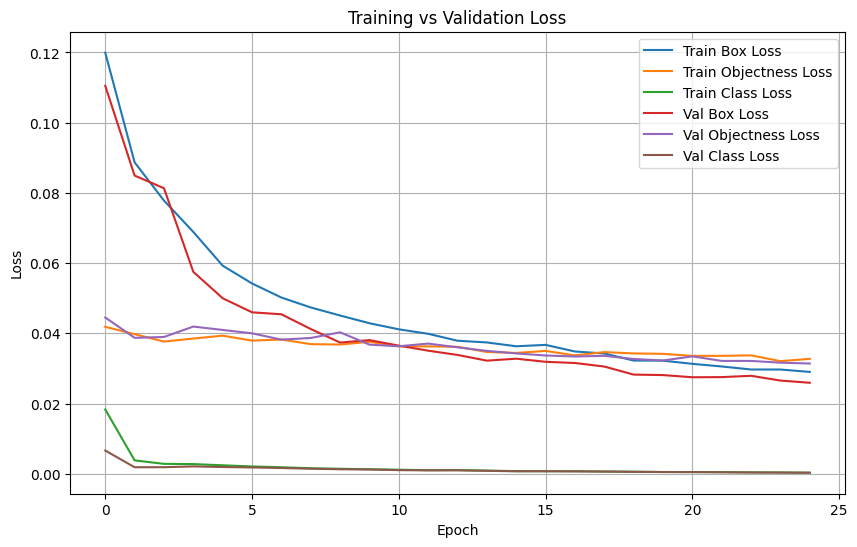

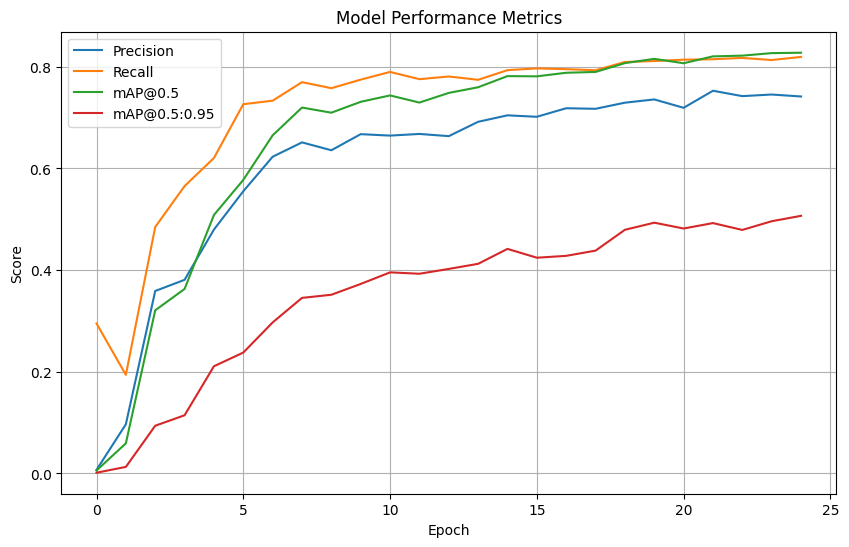

In [ ]:
# Load YOLOv5 training results
results_path = "runs/train/weed25_baseline_test/results.csv"
df = pd.read_csv(results_path)

# Clean column names (remove leading/trailing spaces)
df.columns = df.columns.str.strip()

# ================== Plot Loss Curves ==================
plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['train/obj_loss'], label='Train Objectness Loss')
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Class Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Val Box Loss')
plt.plot(df['epoch'], df['val/obj_loss'], label='Val Objectness Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Val Class Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

# ================== Plot Metrics Curves ==================
plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['metrics/precision'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP_0.5'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95')
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Model Performance Metrics")
plt.legend()
plt.grid(True)
plt.show()


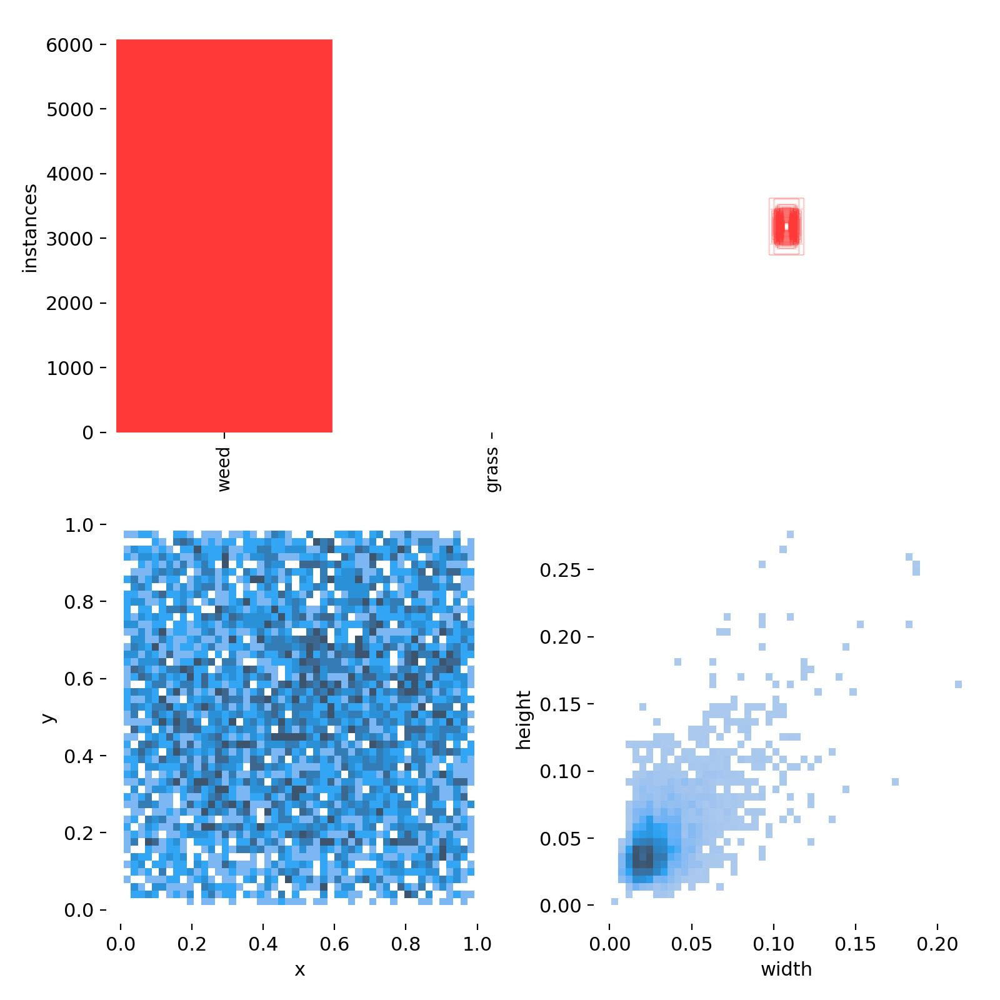

In [ ]:
from IPython.display import Image

# Training results (loss, precision, recall, mAP, etc.)
Image(filename='runs/train/weed25_baseline_test/results.png')

# Confusion Matrix
Image(filename='runs/train/weed25_baseline_test/confusion_matrix.png')

# Dataset distribution
Image(filename='runs/train/weed25_baseline_test/labels.jpg')


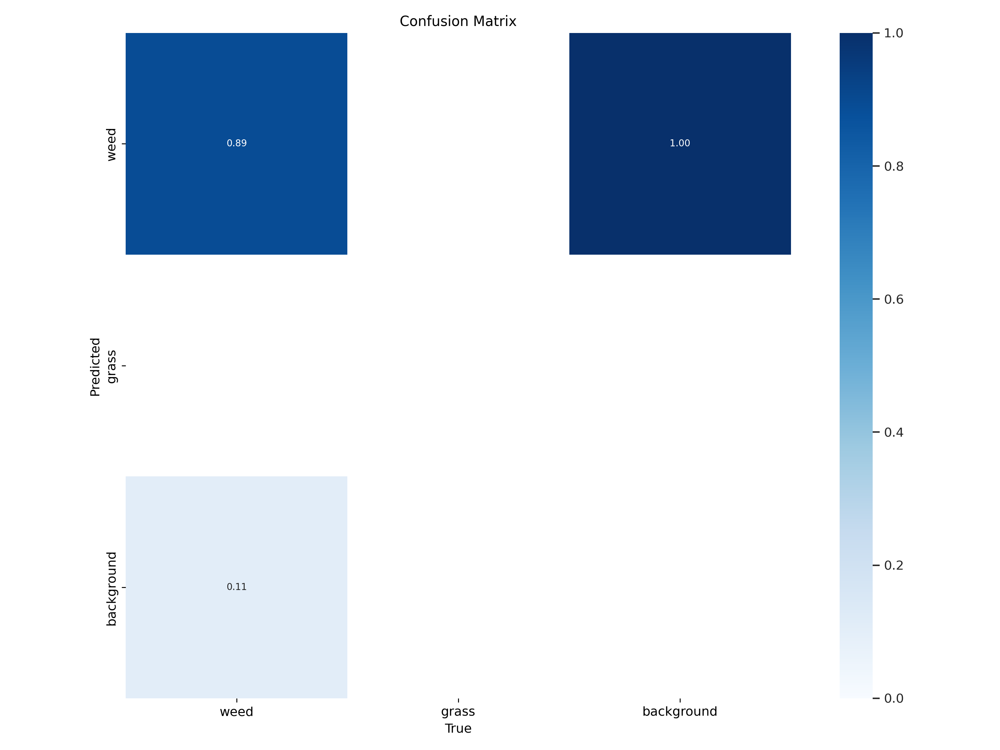

In [ ]:
import glob
from PIL import Image

# Show confusion matrix saved by YOLOv5
conf_matrix_path = glob.glob("runs/train/weed25_baseline_test/confusion_matrix.png")[0]
Image.open(conf_matrix_path)


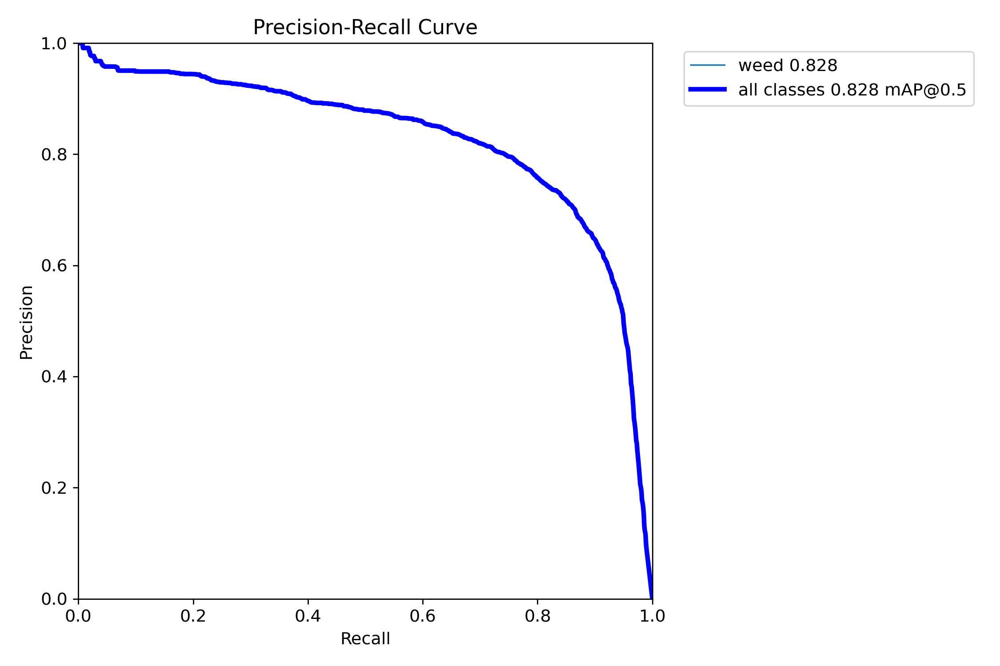

In [ ]:
pr_curve_path = glob.glob("runs/train/weed25_baseline_test/PR_curve.png")[0]
Image.open(pr_curve_path)


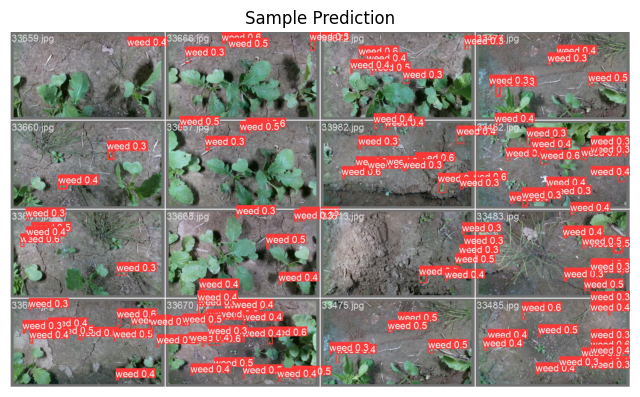

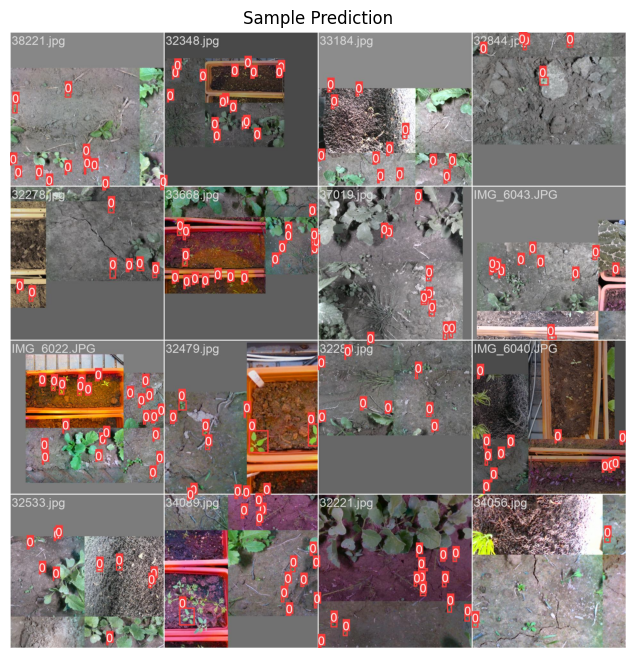

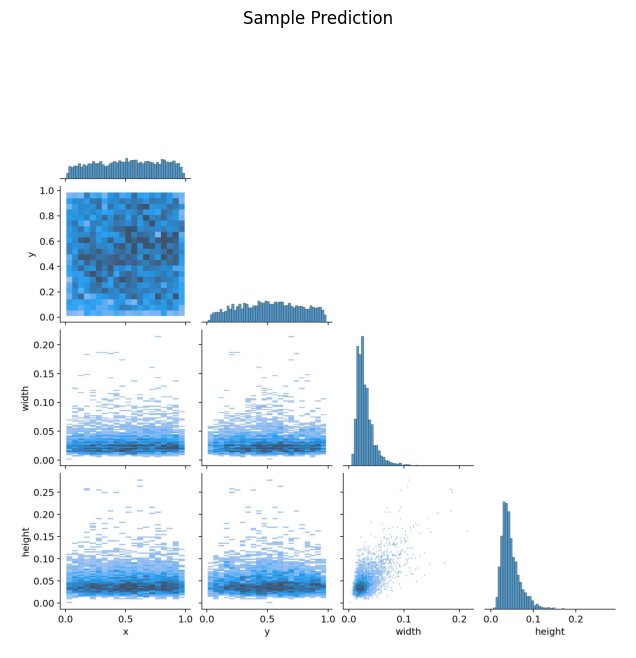

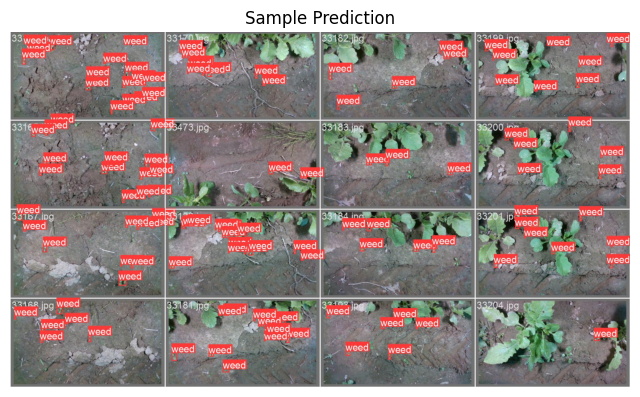

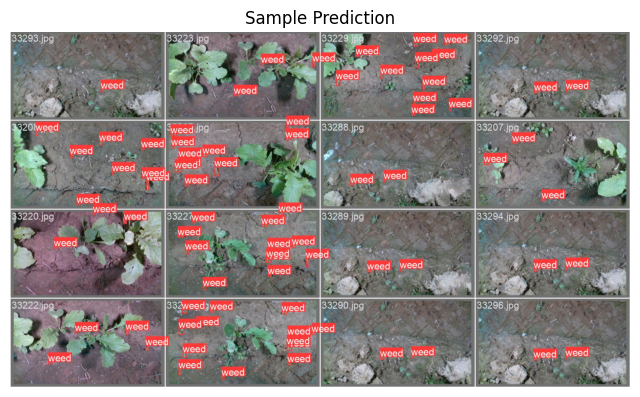

In [ ]:
import random

# Show random predictions from YOLOv5 results
pred_images = glob.glob("runs/train/weed25_baseline_test/*.jpg") + glob.glob("runs/train/weed25_baseline_test/*/*.jpg")
sample_preds = random.sample(pred_images, min(5, len(pred_images)))

for img_path in sample_preds:
    img = Image.open(img_path)
    plt.figure(figsize=(8,8))
    plt.imshow(img)
    plt.axis("off")
    plt.title("Sample Prediction")
    plt.show()


In [ ]:
# Show the last row of training metrics (final performance)
final_results = df.tail(1).T
final_results.columns = ["Final Value"]
display(final_results)


,Final Value
epoch,4.000000
train/box_loss,0.055174
train/obj_loss,0.040539
train/cls_loss,0.001703
metrics/precision,0.547910
metrics/recall,0.678860
metrics/mAP_0.5,0.561320
metrics/mAP_0.5:0.95,0.196520
val/box_loss,0.049381
val/obj_loss,0.040622


In [ ]:
!python val.py --weights runs/train/weed25_baseline_test/weights/best.pt --data data.yaml --img 640


val: data=data.yaml, weights=['runs/train/weed25_baseline_test/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-430-g459d8bf0 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/labels/train.cache... 896 images, 45 backgrounds, 0 corrupt: 100% 941/941 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 30/30 [00:15<00:00,  1.95it/s]
                   all        941       6135      0.567      0.669       0.59      0.228
                  weed        941       6135      0.567      0.669       0.59      0.228
Speed: 0.2ms pre-process, 4.

In [ ]:
!python detect.py --weights runs/train/weed25_baseline_test/weights/best.pt --img 640 --source data/images/


detect: weights=['runs/train/weed25_baseline_test/weights/best.pt'], source=data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-430-g459d8bf0 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 (no detections), 49.0ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 1 weed, 52.2ms
Speed: 0.5ms pre-process, 50.6ms inference, 96.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [ ]:
!python val.py --weights /content/yolov5/runs/train/weed25_baseline_test/weights/best.pt --data data.yaml --img 640


val: data=data.yaml, weights=['/content/yolov5/runs/train/weed25_baseline_test/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-430-g459d8bf0 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/labels/train.cache... 892 images, 49 backgrounds, 0 corrupt: 100% 941/941 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 30/30 [00:16<00:00,  1.85it/s]
                   all        941       6041       0.55      0.678      0.564      0.198
                  weed        941       6041       0.55      0.678      0.564      0.198
Speed: 0.2ms

In [ ]:
weights=['runs/train/weed25_baseline/weights/best.pt']


In [ ]:
!ls runs/train/weed25_baseline/weights/


In [ ]:
!python train.py \
  --img 416 \
  --batch 2 \
  --epochs 1 \
  --data data.yaml \
  --weights yolov5s.pt \
  --name weed25_ultralight \
  --workers 1



In [ ]:
!python val.py --weights runs/train/weed25_baseline/weights/best.pt --data data.yaml --img 640


In [ ]:
!ls runs/train/


In [ ]:
!ls runs/train/weed25_ultralight/weights/


In [ ]:
!python val.py \
  --weights runs/train/weed25_baseline_test \
  --data data.yaml \
  --img 416


/usr/local/lib/python3.12/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


YOLOv5 🚀 2025-9-2 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
image 1/1: 720x1280 1 weed
Speed: 13.4ms pre-process, 46.9ms inference, 136.0ms NMS per image at shape (1, 3, 384, 640)


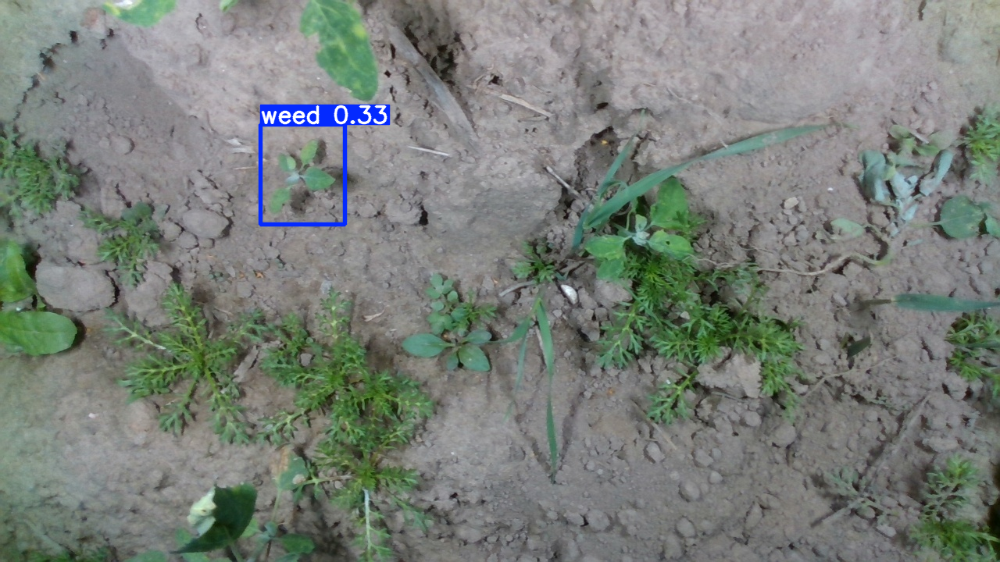

In [ ]:
import torch
from matplotlib import pyplot as plt
import cv2

# Load trained YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolov5/runs/train/weed25_baseline_test/weights/best.pt', force_reload=True)

# Image path
img_path = '/content/yolov5/images/train/12114.jpg'

# Run inference
results = model(img_path)

# Print results (bounding boxes, classes, etc.)
results.print()

# Show results
results.show()

# Optionally display image inline (if results.show() doesn't open)
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
# plt.axis('off')
# plt.title("Original Image - 12114.jpg")
# plt.show()

plt.imshow(img)
plt.xlabel("X-axis (pixels)")
plt.ylabel("Y-axis (pixels)")
plt.title("Original Image - 12114.jpg")
plt.show()



Testing on: /content/yolov5/images/train/32917.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


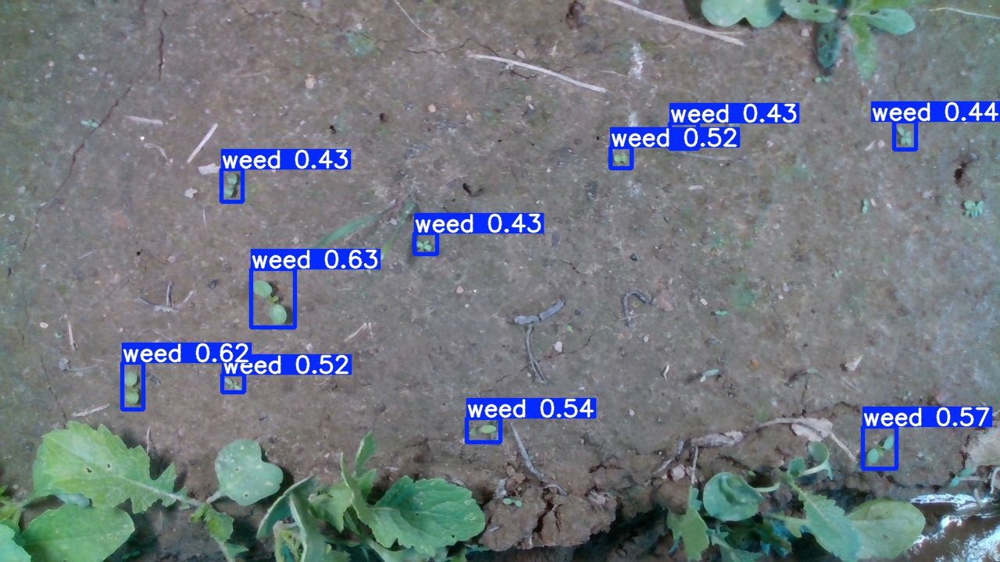

In [ ]:
from glob import glob
import random
import matplotlib.pyplot as plt
import cv2

# Pick random image from training folder
images = glob('/content/yolov5/images/train/*.jpg')
img_path = random.choice(images)
print(f"Testing on: {img_path}")

# Set lower confidence threshold
model.conf = 0.4

# Run inference
results = model(img_path)

# Show YOLO result in a separate window (default)
results.show()

# Also display with matplotlib and axis labels
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.xlabel("X-axis (pixels)")
plt.ylabel("Y-axis (pixels)")
plt.title("Inference Result with Bounding Boxes")
plt.show()



Testing on: /content/yolov5/images/train/12203.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


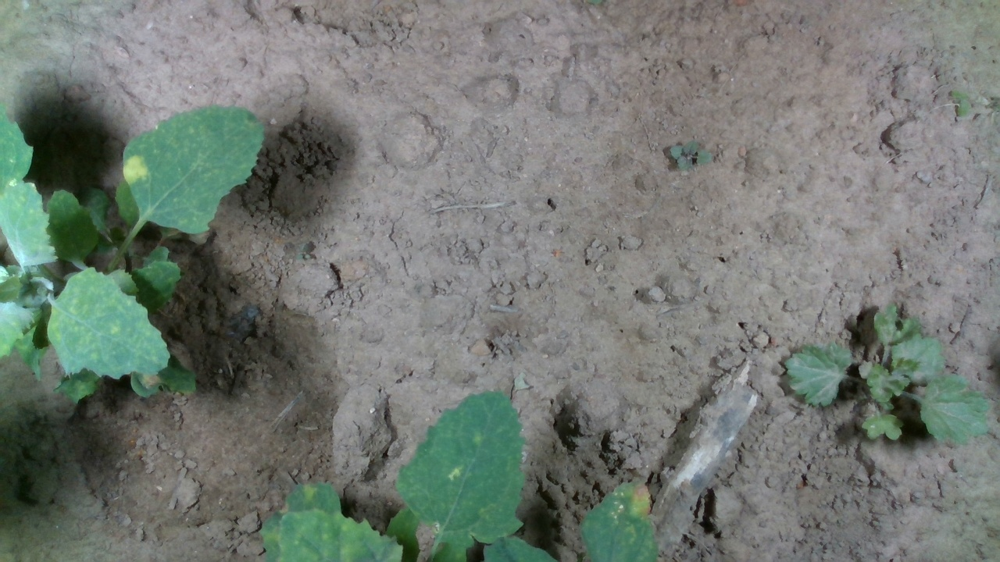

Testing on: /content/yolov5/images/train/34315.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


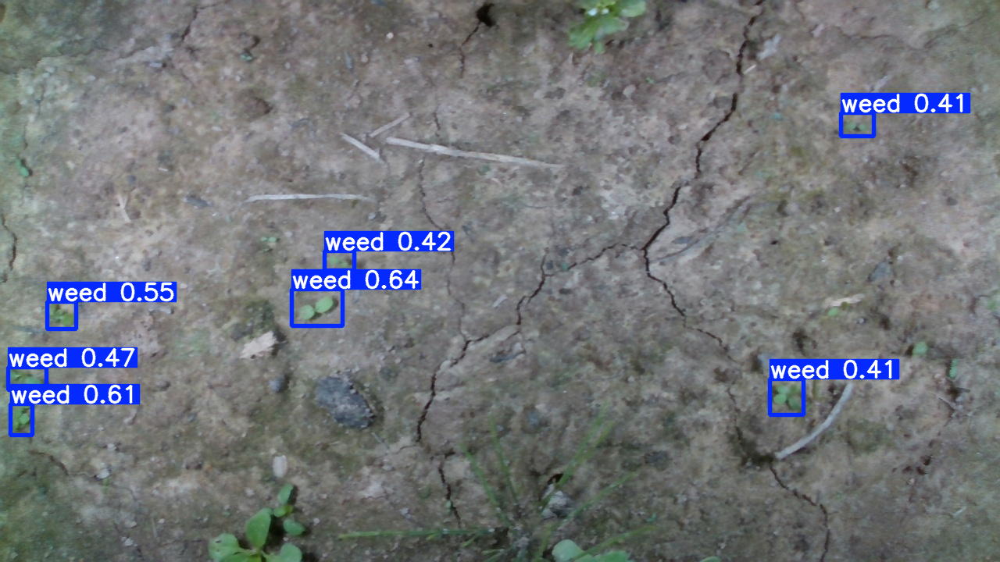

Testing on: /content/yolov5/images/train/32860.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


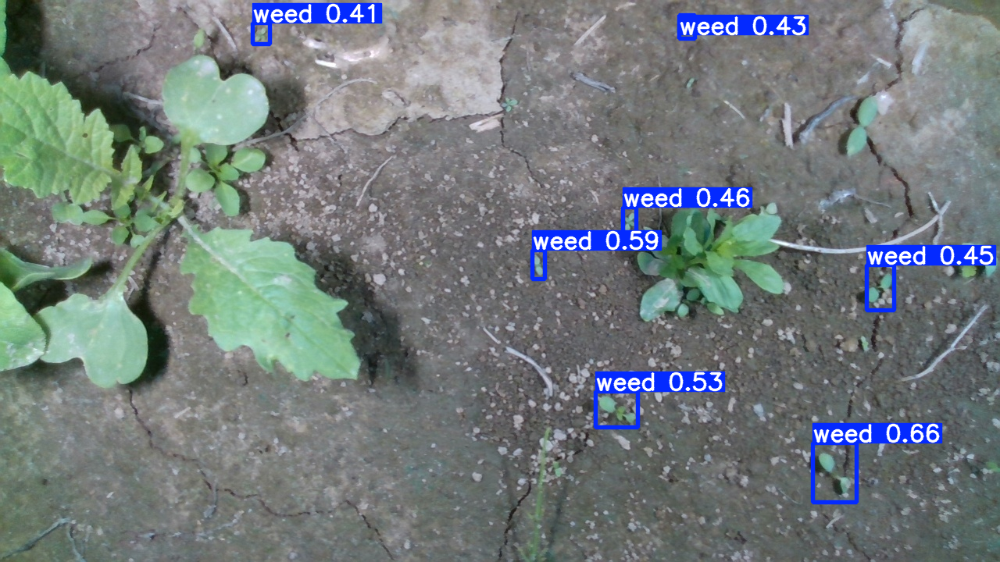

Testing on: /content/yolov5/images/train/33204.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


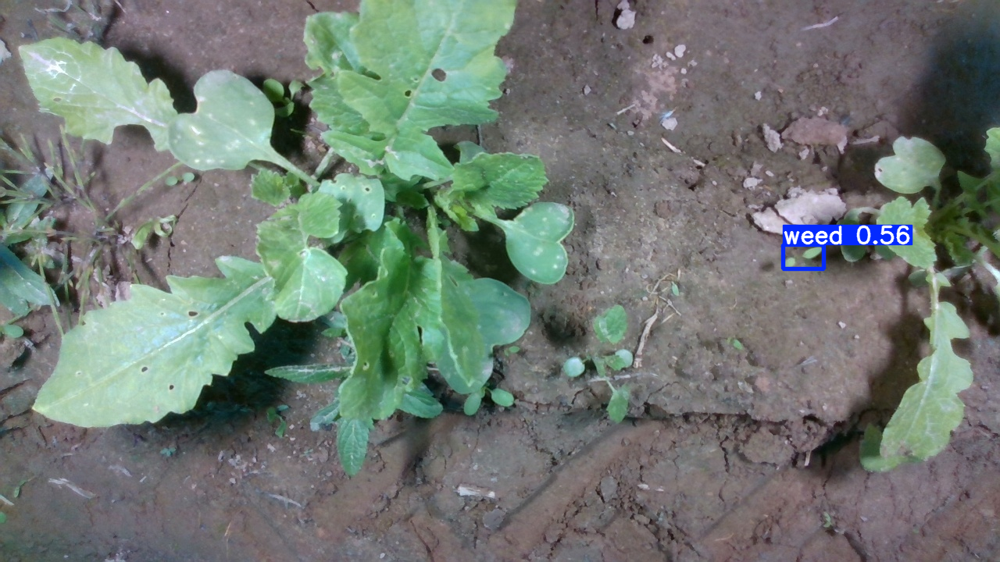

Testing on: /content/yolov5/images/train/32527.jpg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


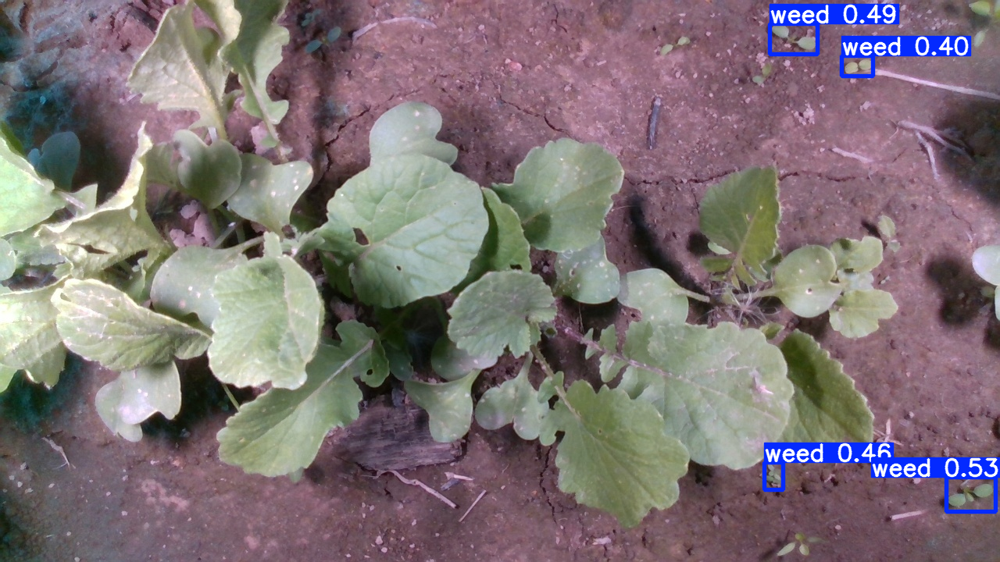

In [ ]:
from glob import glob
import random

model.conf = 0.4

images = glob('/content/yolov5/images/train/*.jpg')
for i in range(5):
    img_path = random.choice(images)
    print(f"Testing on: {img_path}")
    results = model(img_path)
    results.show()
